In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from keras.layers import Input, Dense, concatenate
from keras.models import Model
from keras.optimizers import Adam
from keras import backend as K

Using TensorFlow backend.


In [2]:
class Environment:
    def __init__(self, noise=0, friction=0):
        self.n_actions = 3
        self.n_obs = 3
        self.max_steps = 100
        self.shape = (3,10)
        self.noise = noise
        self.friction = friction
        
    def reset(self):
        self.x = self.shape[1]
        self.state = []
        self.allocation = np.zeros(shape=(3,))
        self.allocation[0] = 1
        self.episode_rewards = [0]
        self.previous_allocation = self.allocation
        
        self.x_space = np.arange(self.max_steps)
        a0_space = np.zeros_like(np.linspace(0,1,self.max_steps))
        self.state.append(a0_space)
        current = [a0_space[self.x-self.shape[1]:self.x]]
        for i in range(1, self.shape[0]):
            a_c = np.random.randint(2,17)
            a_space = np.sin(np.linspace(0,a_c*np.pi,self.max_steps))
            a_space += np.random.normal(0, self.noise, size=a_space.shape)
            self.state.append(a_space)
            current.append(a_space[self.x-self.shape[1]:self.x])
            
        return np.array(current)
    
    def step(self, allocation):
        self.allocation = allocation
        self.x += 1
        current = []
        reward = []
        for i in range(self.shape[0]):
            a_space = self.state[i][self.x-self.shape[1]:self.x]
            current.append(a_space)
            reward.append(a_space[-1]*allocation[i])
        
        cost = self.friction*abs(self.previous_allocation - allocation)
        reward -= cost
        self.previous_allocation = self.allocation
            
        done = False
        if self.x >= self.max_steps - 1:
            done = True
            
        self.episode_rewards.append(np.sum(reward))
        return np.array(current), reward, done, {}
    
    def get_render_data(self):
        return self.x_data, self.a0_data, self.a1_data, self.a2_data, self.allocation
    
    def render(self):
        #x_data, a0_data, a1_data, a2_data, alloc_data = self.get_render_data()
        fig, ax = plt.subplots(1,3,figsize=(12,4),gridspec_kw = {'width_ratios':[2, 1,1]})

        for i in range(self.shape[0]):
            a_space = self.state[i]
            ax[0].plot(self.x_space, a_space, label=str(i))
            
        ax[0].legend(loc='upper left')
        ax[0].plot([self.x, self.x], [-0.1,0.1], 'k')
        ax[1].set_ylim(0,1)
        ax[1].bar([0,1,2], self.allocation)
        ax[2].plot(self.episode_rewards)

        plt.show()

s0 (3, 10)
s [[ 0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]
 [ 0.17160093  0.48268146  0.89744421  1.16482632  0.56963812  0.81861952
   0.37007723  1.10290803  0.21663317  1.06671329]
 [-0.22181669  1.07667404  0.2339961   1.20320423  1.82223799  0.84557297
   1.55624582  0.75074085 -0.60858947 -0.17325405]]
r [ 0.          0.21334266 -0.08662703]
d False


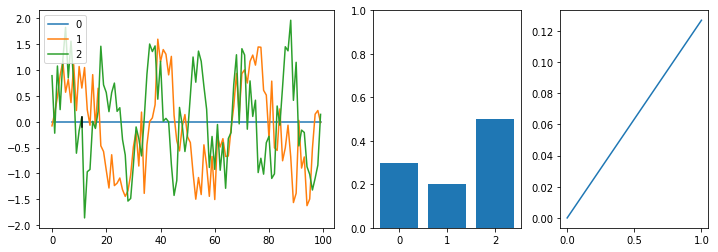

In [3]:
env = Environment(0.5)
s0 = env.reset()
print('s0', s0.shape)
s, r, d, i = env.step(np.array([0.3, 0.2, 0.5]))
print('s',s)
print('r',r)
print('d',d)
env.render()

In [4]:
class Agent:
    def __init__(self, n_obs, n_actions,
                epsilon=0.2, gamma=0.99, entropy_loss=1e-2, actor_lr=0.001, critic_lr=0.005,
                hidden_size=128, epochs=10, batch_size=64, buffer_size=256):
        # Clear Tensorflow session and set some metadata
        K.clear_session()
        self.n_obs = n_obs
        self.n_actions = n_actions
        self.obs_shape = None
        
        # Set hyperparameters
        self.epsilon = epsilon
        self.gamma = gamma
        self.entropy_loss = entropy_loss
        self.coef = 0.01
        self.actor_lr = actor_lr
        self.critic_lr = critic_lr
        self.hidden_size = hidden_size
        self.epochs = epochs
        self.batch_size = batch_size
        self.buffer_size = buffer_size
        
        # Build Actor and Critic models
        self.actor = self.build_actor() 

        self.DUMMY_ALLOCATION, self.DUMMY_VALUE = np.zeros((1, self.n_actions)), np.zeros((1, self.n_obs))

    def proximal_policy_optimization_loss(self, advantage, debug=True):
        def loss(y_true, y_pred):
            y_pred = K.print_tensor(y_pred, 'pred ')
            adv = K.print_tensor(advantage, 'adva ')
            return -self.coef*adv*y_pred + self.entropy_loss*y_pred*K.log(y_pred+1e-10)
        return loss
    
    def build_actor(self):
        state_inputs = Input(shape=(self.n_obs*10,),name='observation')
        advantage = Input(shape=(self.n_obs,),name='advantage')
        previous_allocation = Input(shape=(self.n_actions,),name='previous_allocation')

        x = concatenate([state_inputs, previous_allocation])
        x = Dense(self.hidden_size, activation='relu')(state_inputs)
        x = Dense(self.hidden_size, activation='relu')(x)
        
        out_actions = Dense(self.n_actions, activation='softmax')(x)

        model = Model(inputs=[state_inputs, advantage, previous_allocation],
                      outputs=[out_actions])
        
        model.compile(optimizer=Adam(lr=self.actor_lr),
                      loss=[self.proximal_policy_optimization_loss(
                          advantage=advantage
                      )])
        return model

    def get_allocation(self, obs, prev_alloc):
        obs = np.array([obs.flatten()])
        p_al = np.array([prev_alloc])
        alloc = self.actor.predict([obs, self.DUMMY_VALUE, p_al])
        if print_log:
            print('get_allocation')
            print('obs shape:', obs.shape)
            print('DUMMY shape:', self.DUMMY_VALUE.shape)
            print('alloc shape:', alloc.shape)
            print()
        return alloc
    
    def train_batch(self, observations, allocations, rewards, previous_allocations):
        # limit our data to the buffer_size
        obs = observations[:self.buffer_size]
        allocs = allocations[:self.buffer_size]
        rews = rewards[:self.buffer_size]
        prev_allocs = previous_allocations[:self.buffer_size]
        
        if print_log:
            print('train_batch:')
            print('obs Shape:', obs.shape)
            print('allocs Shape:', allocs.shape)
            print('rews Shape:', rews.shape)
            print()
        
        self.actor.fit([obs, rews, prev_allocs], [allocs],
                       batch_size=self.batch_size, shuffle=True,
                       epochs=self.epochs, verbose=False)
    
    def run(self, env, episodes, verbose=False, test_run=False):
        episode = 0
        reward_history = []
        end_test=False
        self.obs_shape = env.shape

        # reset the environment
        observation = env.reset()

        # Collect a batch of samples
        while episode < episodes:
            # 'Master Batch' that we add mini batches to
            batch = {
                'observation': [],
                'allocation_vector': [],
                'previous_allocation_vector': [],
                'reward': []
            }

            # Mini batch which contains a single episode's data
            tmp_batch = {
                'observation': [],
                'allocation_vector': [],
                'previous_allocation_vector': [],
                'reward': []
            }
            
            previous_alloc_vector = env.allocation
            tmp_batch['previous_allocation_vector'].append(previous_alloc_vector)

            # While we don't hit the buffer size with our master batch...
            while len(batch['observation']) < self.buffer_size and not end_test:
                # Get the action (scalar), action vector (one-hot vector), 
                # and probability distribution (vector) from the current observation
                observation = np.array(observation)
                
                alloc_vector = self.get_allocation(observation, previous_alloc_vector)[0]

                # Get the next observation, reward, done, and info for taking an action
                next_observation, reward, done, info = env.step(alloc_vector)

                # Append the data to the mini batch
                tmp_batch['observation'].append(observation)
                tmp_batch['allocation_vector'].append(alloc_vector)
                tmp_batch['previous_allocation_vector'].append(previous_alloc_vector)
                tmp_batch['reward'].append(reward)

                # The current observation is now the 'next' observation
                observation = next_observation
                previous_alloc_vector = alloc_vector
                
                if test_run:
                    env.render()

                # if the episode is at a terminal state...
                if done:
                    # log some reward data (for plotting)
                    reward_data = np.sum(tmp_batch['reward'])
                    reward_history.append(reward_data)

                    # transform rewards based to discounted cumulative rewards
                    # for j in range(len(tmp_batch['reward']) - 2, -1, -1):
                    #     tmp_batch['reward'][j] += tmp_batch['reward'][j + 1] * self.gamma

                    # for each entry in the mini batch...
                    for i in range(len(tmp_batch['observation'])):
                        # we unpack the data
                        obs = tmp_batch['observation'][i]
                        alloc = tmp_batch['allocation_vector'][i]
                        previous_alloc = tmp_batch['previous_allocation_vector'][i]
                        r = tmp_batch['reward'][i]

                        # and pack it into the master batch
                        batch['observation'].append(obs.flatten())
                        batch['allocation_vector'].append(alloc)
                        batch['previous_allocation_vector'].append(previous_alloc)
                        batch['reward'].append(r)

                    # every 10th episode, log some stuff
                    if (episode % 100 == 0 or episode == episodes - 1):
                        print('Episode:', episode)
                        print('Reward :', reward_data)
                        print('Average:', np.mean(reward_history[-100:]))
                        print('-'*10)
                        print()
                        env.render()

                    # reset the environment
                    observation = env.reset()

                    # reset the mini batch
                    tmp_batch = {
                        'observation': [],
                        'allocation_vector': [],
                        'previous_allocation_vector': [],
                        'reward': []
                    }

                    # increment the episode count
                    episode += 1
                    
                    if test_run:
                        end_test = True

            if test_run:
                break
                
            # we've filled up our master batch, so we unpack it into numpy arrays
            observations = np.array(batch['observation'])
            allocs = np.array(batch['allocation_vector'])
            prev_allocs = np.array(batch['previous_allocation_vector'])
            rewards = np.array(batch['reward'])    
            #rewards = np.reshape(rewards, (len(batch['reward']), 1))

            # train the agent on the batched data
            self.train_batch(observations, allocs, rewards, prev_allocs)
                    
        self.reward_history = reward_history
        return self.reward_history

Instructions for updating:
Use tf.print instead of tf.Print. Note that tf.print returns a no-output operator that directly prints the output. Outside of defuns or eager mode, this operator will not be executed unless it is directly specified in session.run or used as a control dependency for other operators. This is only a concern in graph mode. Below is an example of how to ensure tf.print executes in graph mode:
```python
    sess = tf.Session()
    with sess.as_default():
        tensor = tf.range(10)
        print_op = tf.print(tensor)
        with tf.control_dependencies([print_op]):
          out = tf.add(tensor, tensor)
        sess.run(out)
    ```
Additionally, to use tf.print in python 2.7, users must make sure to import
the following:

  `from __future__ import print_function`

Episode: 0
Reward : -13.887663290811286
Average: -13.887663290811286
----------



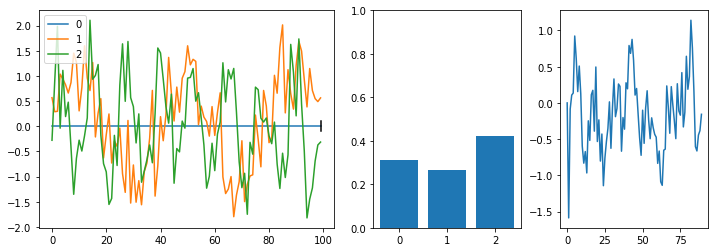

Episode: 100
Reward : -2.9532703443025112
Average: -5.193445411681108
----------



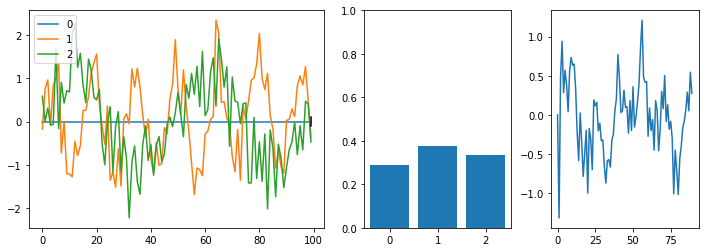

Episode: 200
Reward : -9.243425437066527
Average: -3.504347343290914
----------



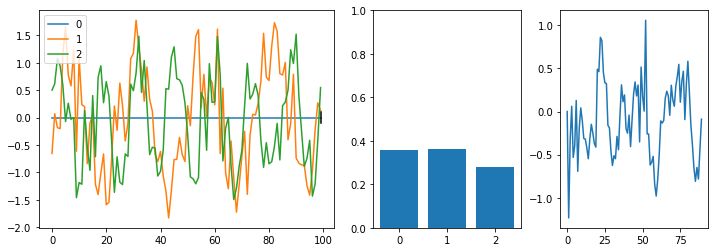

Episode: 300
Reward : -7.525077913234883
Average: -3.4465691099678146
----------



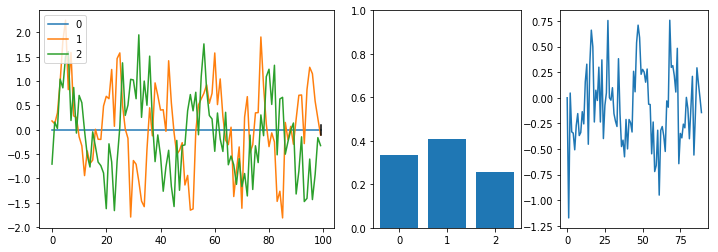

Episode: 400
Reward : 0.8493350547234044
Average: -3.2241200830252073
----------



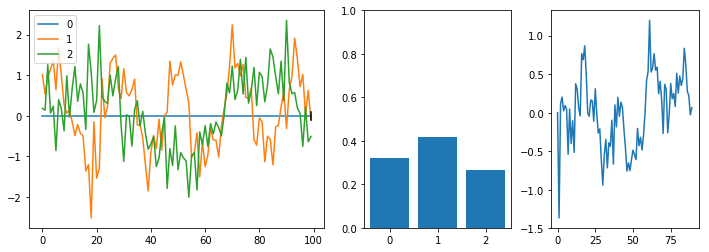

Episode: 500
Reward : 0.8320132109344187
Average: -2.8642112963055073
----------



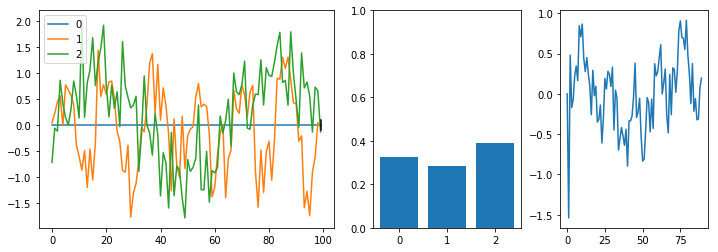

Episode: 600
Reward : -7.251485996699832
Average: -3.65181042376583
----------



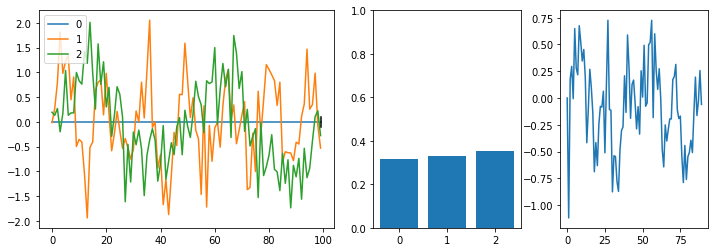

Episode: 700
Reward : -5.573202184869723
Average: -2.8017271719843517
----------



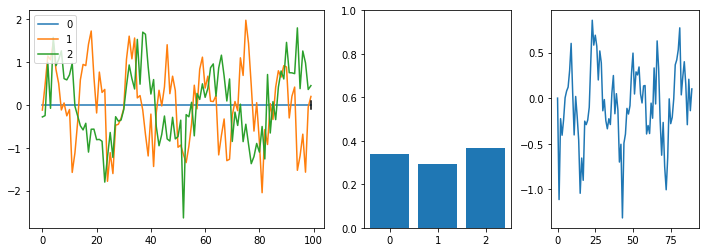

Episode: 800
Reward : -8.594550724865048
Average: -3.65412364975344
----------



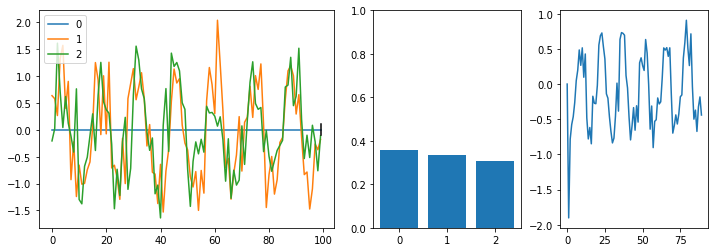

Episode: 900
Reward : -4.550063825409894
Average: -2.1329050785841854
----------



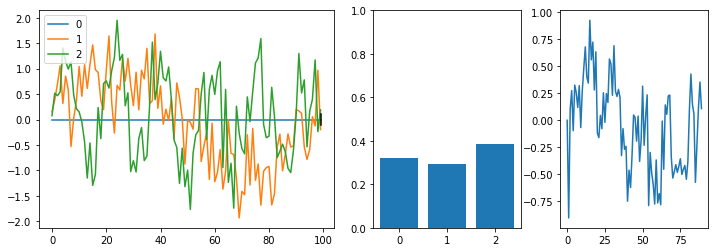

Episode: 1000
Reward : -2.6434389946738097
Average: -2.5117893384332395
----------



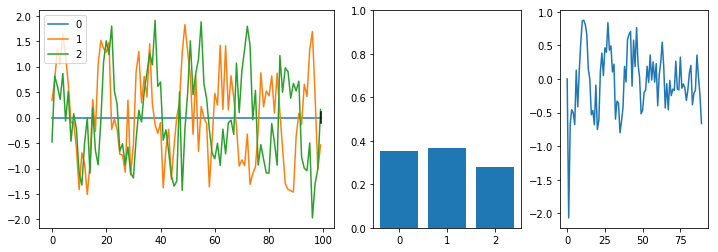

Episode: 1100
Reward : -7.1963867208509065
Average: -2.9131519928478595
----------



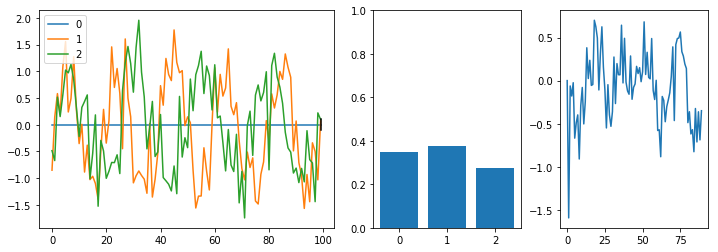

Episode: 1200
Reward : -4.303252733562897
Average: -2.595355733855418
----------



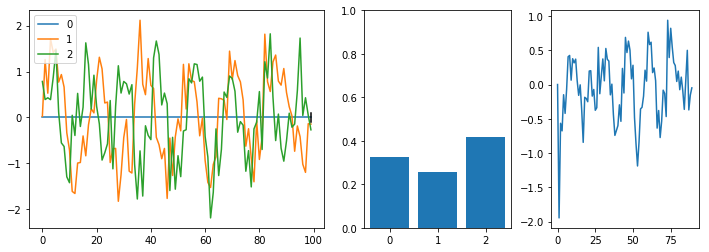

Episode: 1300
Reward : -2.8508792066979947
Average: -2.1238041485153576
----------



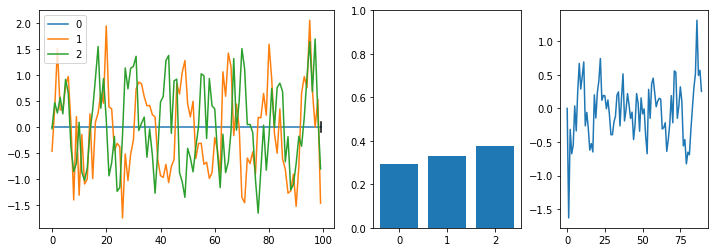

Episode: 1400
Reward : -0.7225248405119475
Average: -1.2302699908426997
----------



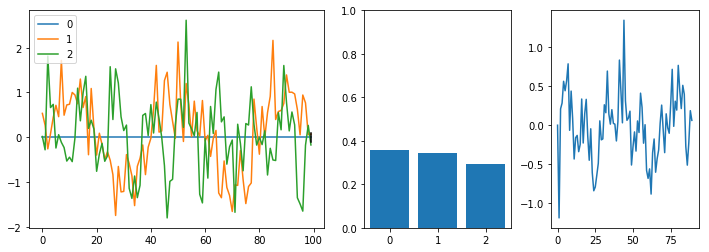

Episode: 1500
Reward : -3.9434919910404673
Average: -2.024141599103336
----------



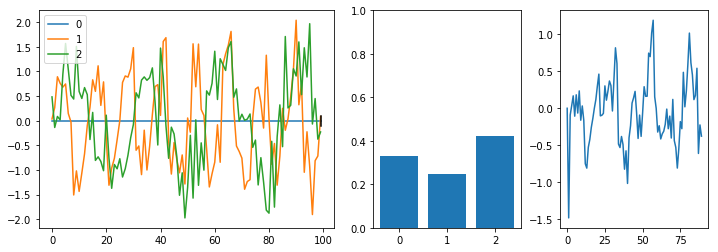

Episode: 1600
Reward : 1.0152967848031664
Average: -1.9472466525996353
----------



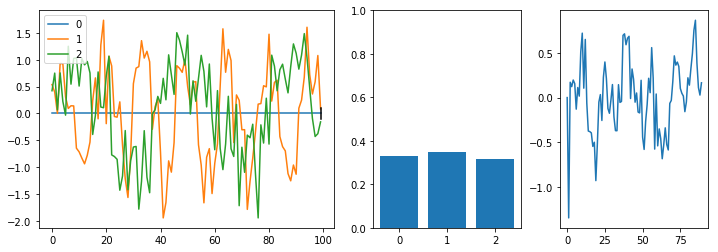

Episode: 1700
Reward : 0.6753148257566899
Average: -1.9116810612851396
----------



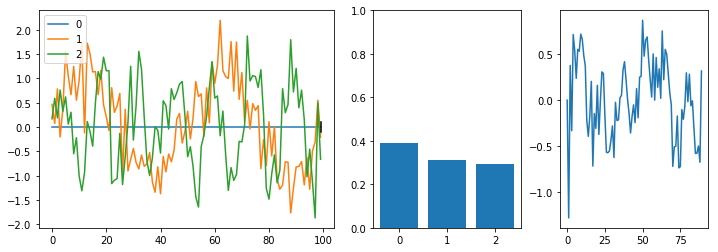

Episode: 1800
Reward : -3.5474821220096096
Average: -1.7170845049897168
----------



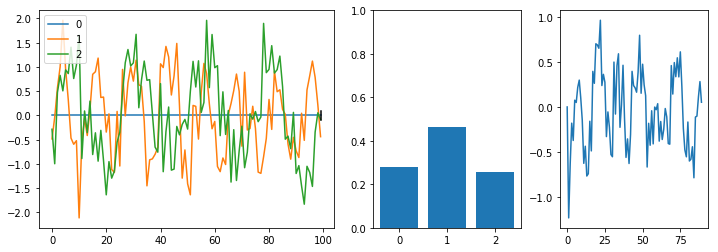

Episode: 1900
Reward : -5.585025201226406
Average: -1.6865344333565508
----------



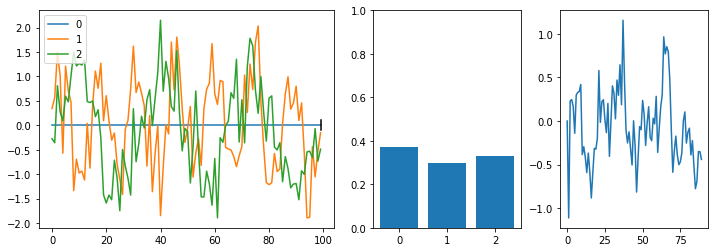

Episode: 2000
Reward : 3.728932371585971
Average: -1.4302172916698594
----------



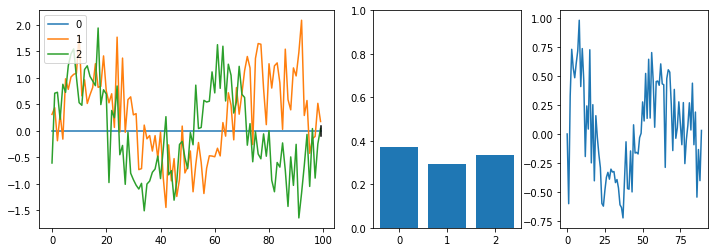

Episode: 2100
Reward : -6.557567926435993
Average: -1.8431602520806354
----------



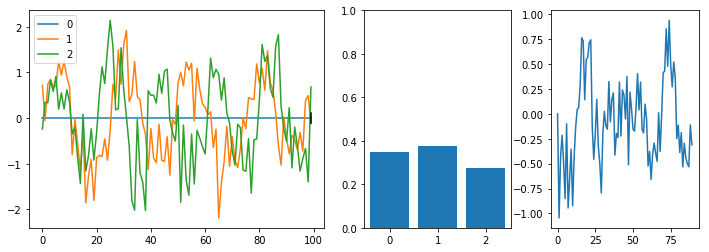

Episode: 2200
Reward : -2.0266579959975672
Average: -1.99777218158412
----------



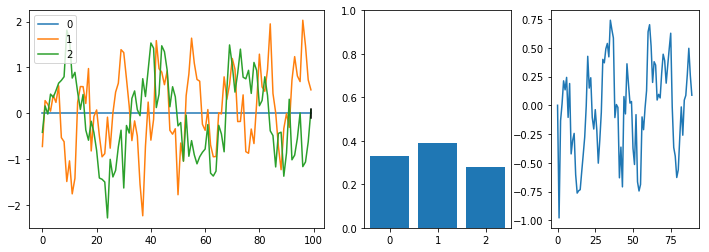

Episode: 2300
Reward : -3.0953315974165116
Average: -1.5416953029111033
----------



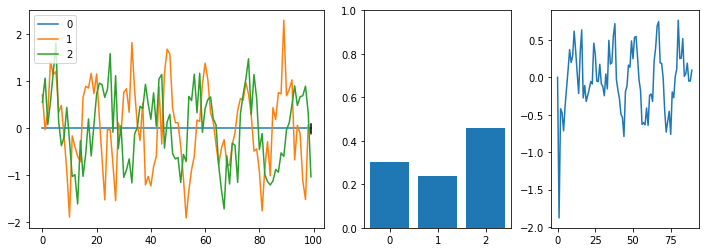

Episode: 2400
Reward : -3.1466436660794725
Average: -2.299739616996744
----------



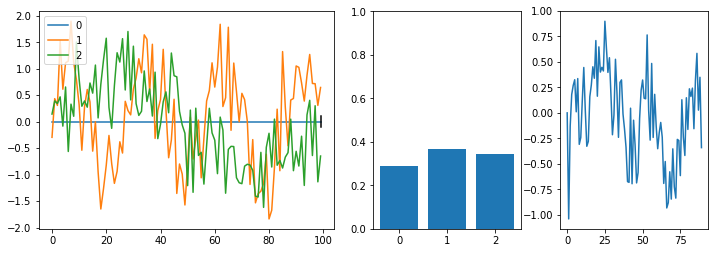

Episode: 2500
Reward : -5.423450707164633
Average: -1.154606058082148
----------



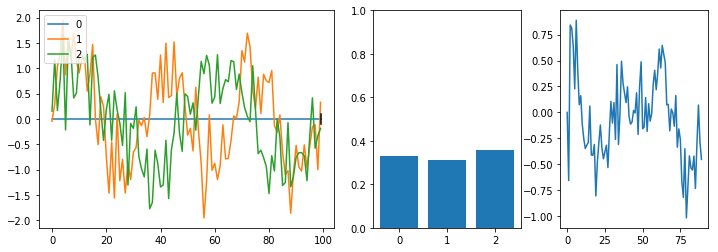

Episode: 2600
Reward : -3.7532525522279254
Average: -0.935186542001879
----------



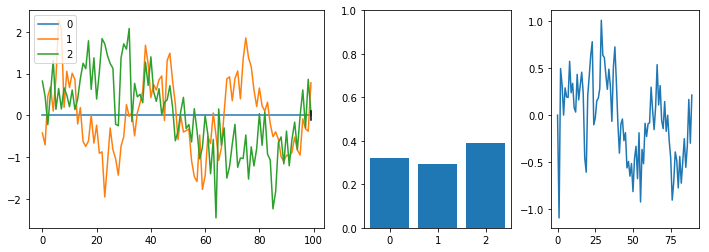

Episode: 2700
Reward : 0.47062549083976624
Average: -1.807016430492376
----------



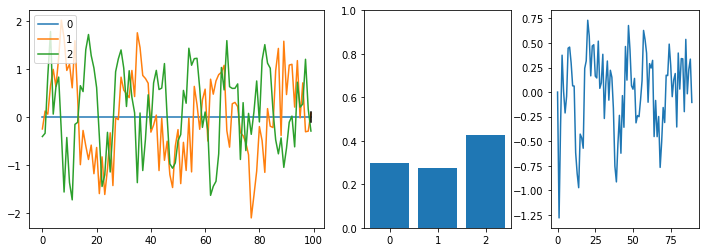

Episode: 2800
Reward : -3.485135506836583
Average: -1.5489970139984552
----------



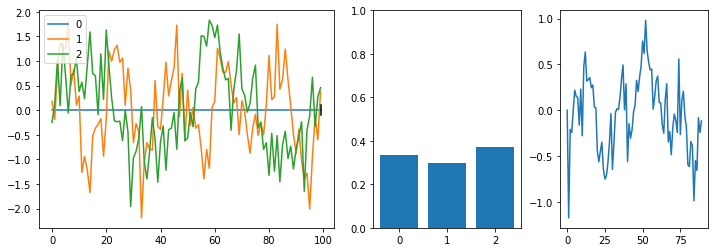

Episode: 2900
Reward : -5.173625358548279
Average: -1.3196655599449645
----------



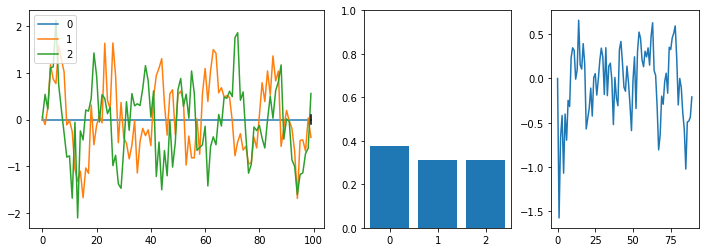

Episode: 3000
Reward : -2.954909346383351
Average: -1.9492917537080021
----------



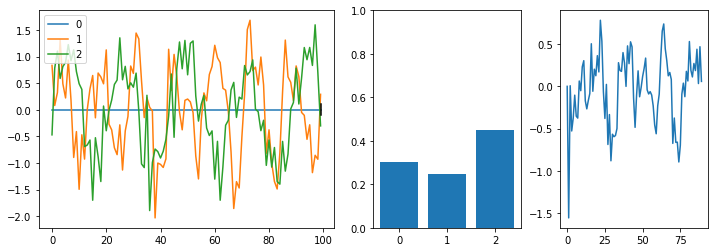

Episode: 3100
Reward : 2.533160927583084
Average: -1.5494295463596592
----------



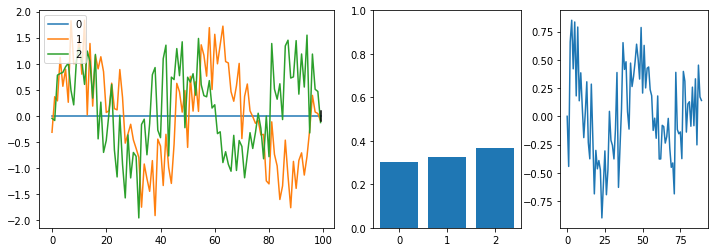

Episode: 3200
Reward : -1.1296477832353364
Average: -1.6410607458086497
----------



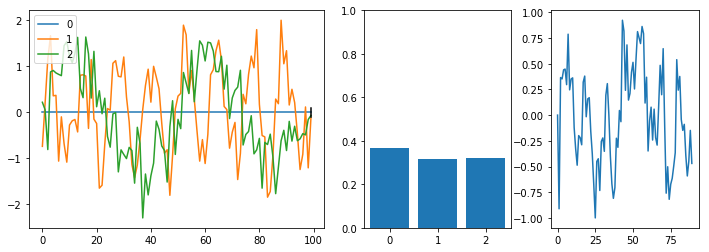

Episode: 3300
Reward : -4.831128161063126
Average: -1.5959727866556424
----------



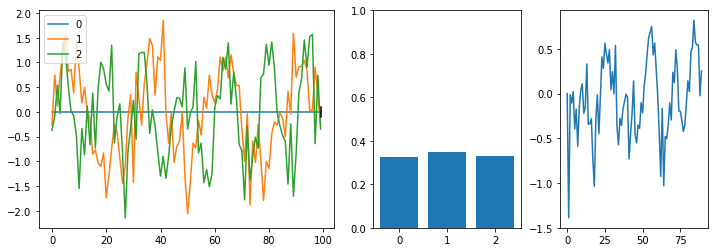

Episode: 3400
Reward : 7.759359311695391
Average: -1.141335689345581
----------



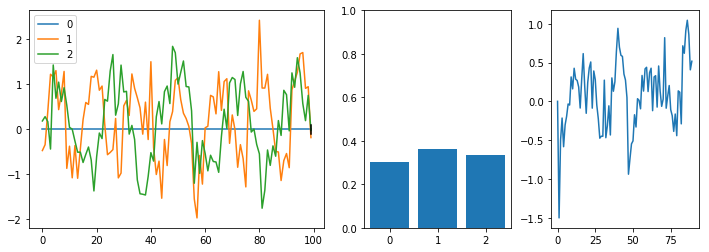

Episode: 3500
Reward : -6.843073515686019
Average: -1.9679398675868498
----------



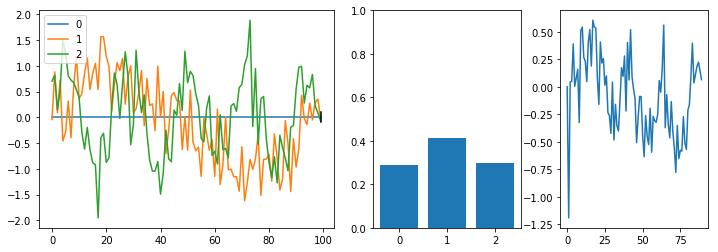

Episode: 3600
Reward : -1.8346520243665594
Average: -1.530981415027411
----------



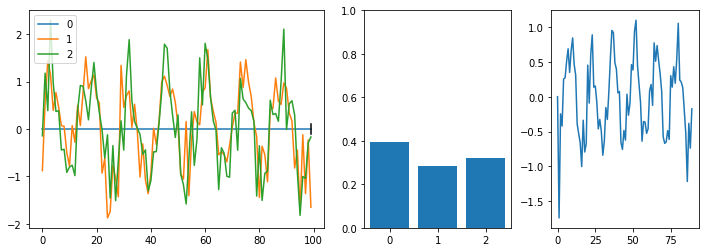

Episode: 3700
Reward : 1.3359773011571816
Average: -1.147831842946541
----------



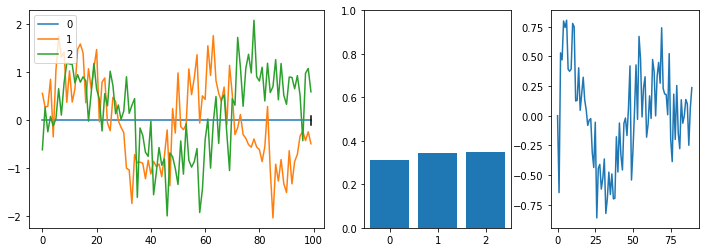

Episode: 3800
Reward : -2.469277806477708
Average: -1.7812169015511683
----------



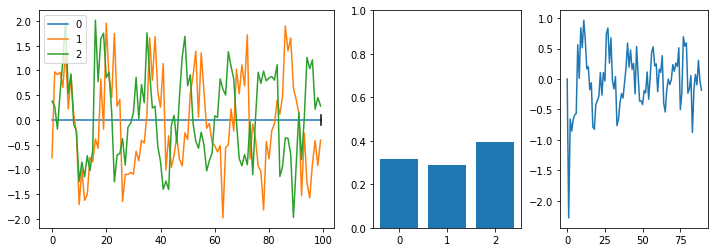

Episode: 3900
Reward : -1.7220622533316403
Average: -1.740924594900188
----------



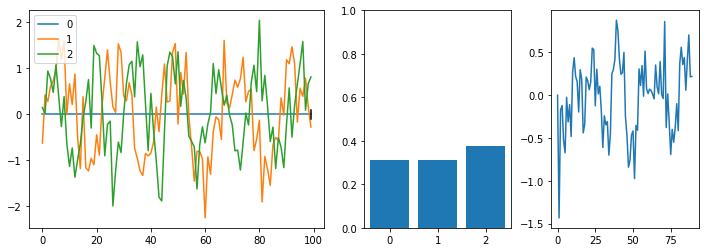

Episode: 4000
Reward : -3.078353854805904
Average: -1.9045586214784551
----------



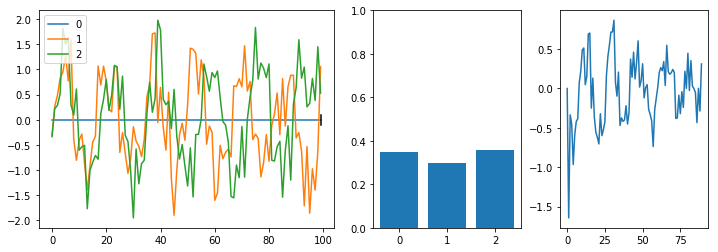

Episode: 4100
Reward : -0.673122499610765
Average: -0.5708924336165344
----------



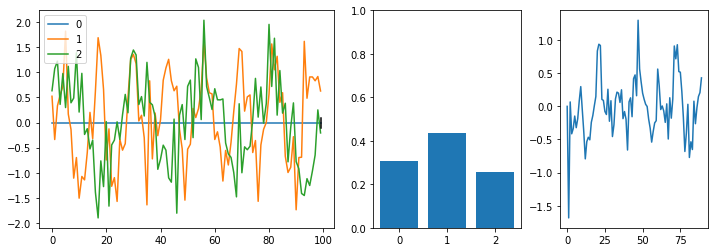

Episode: 4200
Reward : -5.298825514084887
Average: -1.12233863944438
----------



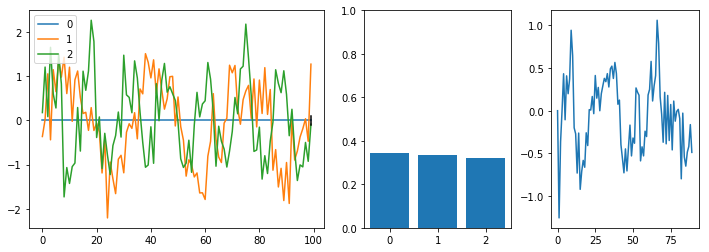

Episode: 4300
Reward : -7.851663068078812
Average: -1.6427568837667477
----------



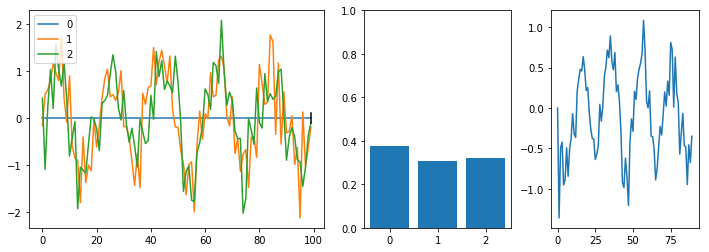

Episode: 4400
Reward : 2.169159061154446
Average: -1.0043486776069832
----------



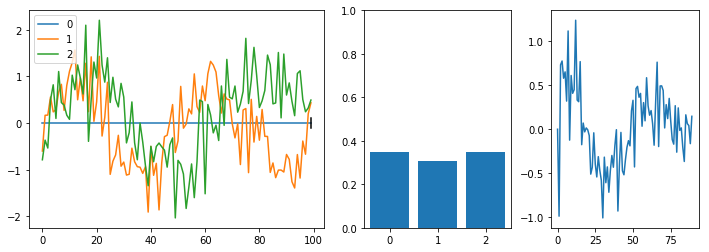

Episode: 4500
Reward : -4.949460665412802
Average: -1.9965077788763301
----------



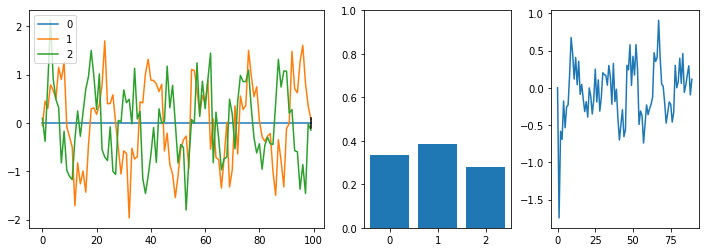

Episode: 4600
Reward : -3.0854184691565285
Average: -1.838485168055398
----------



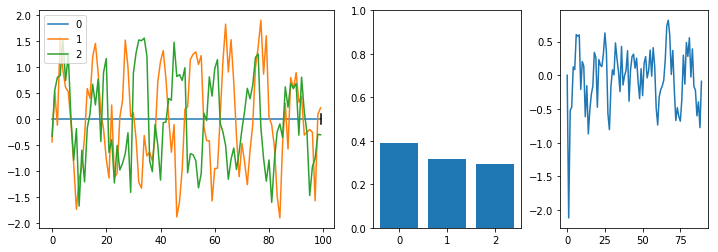

Episode: 4700
Reward : 2.041113195662203
Average: -1.46891956866932
----------



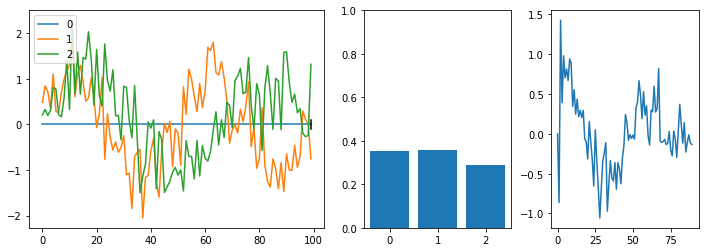

Episode: 4800
Reward : -7.094647180019022
Average: -1.527677738346523
----------



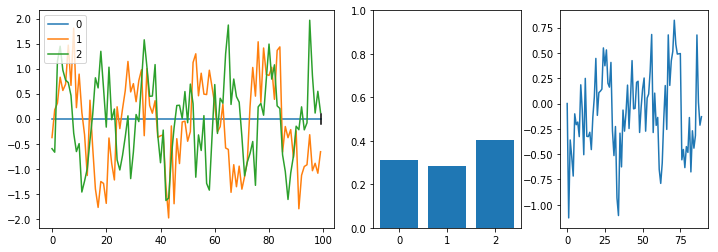

Episode: 4900
Reward : -2.627198280938967
Average: -1.7337972909854082
----------



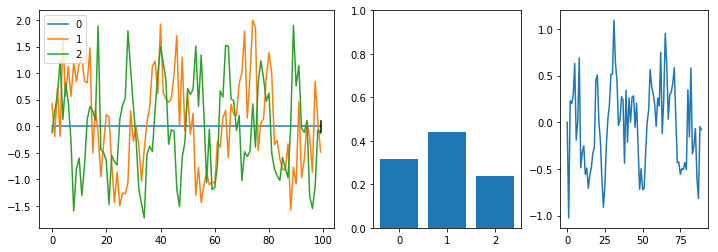

Episode: 5000
Reward : 0.5288231617766277
Average: -1.4670247382305024
----------



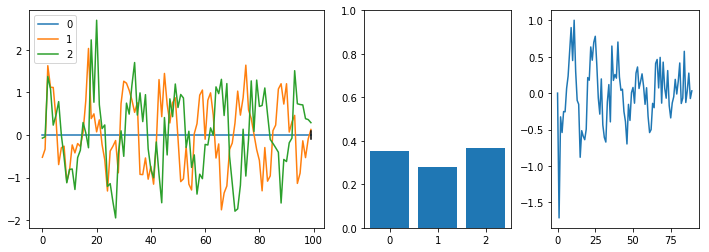

Episode: 5100
Reward : -1.7797055244834938
Average: -1.6417188448523914
----------



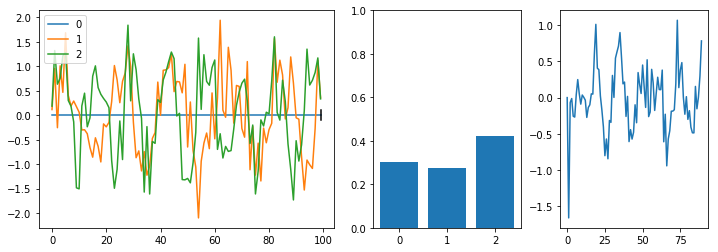

Episode: 5200
Reward : -2.376366728757549
Average: -1.7384533649075558
----------



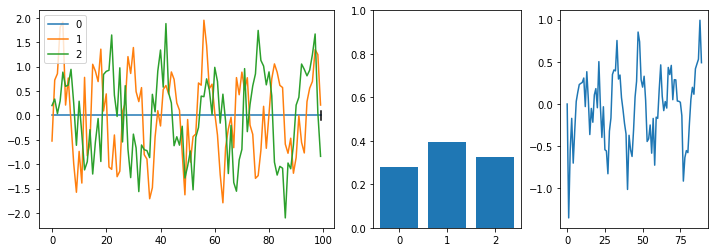

Episode: 5300
Reward : -2.6366860638764327
Average: -0.9870229329712161
----------



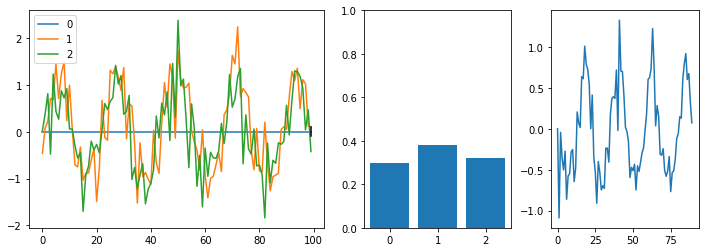

Episode: 5400
Reward : -2.318605168809442
Average: -0.6130859168370324
----------



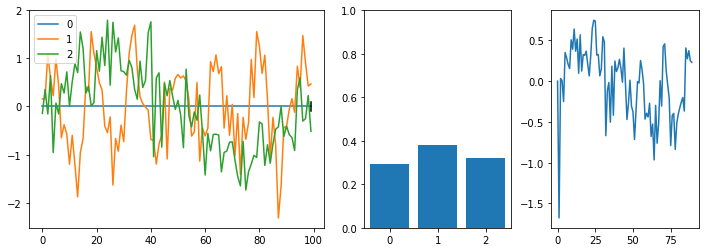

Episode: 5500
Reward : -1.9344400415607548
Average: -2.031040208900954
----------



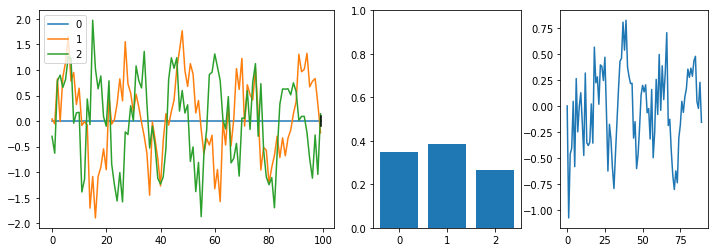

Episode: 5600
Reward : -6.14832359551534
Average: -1.9938305886766745
----------



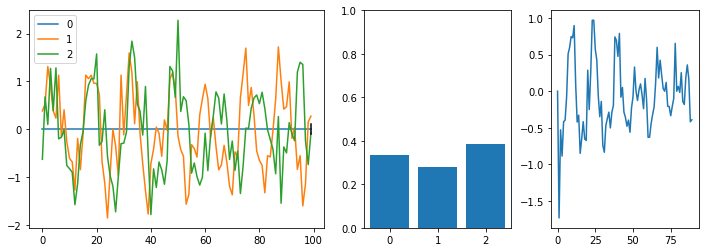

Episode: 5700
Reward : -1.0303519480156096
Average: -0.8741381569103058
----------



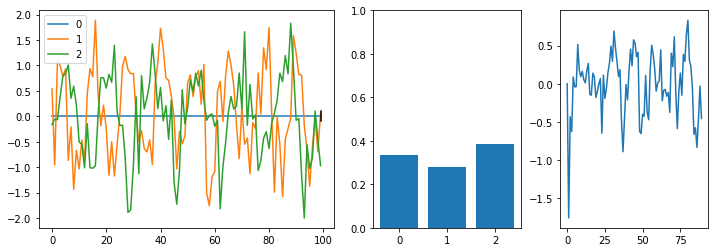

Episode: 5800
Reward : 1.4050714206634245
Average: -0.8823879093191404
----------



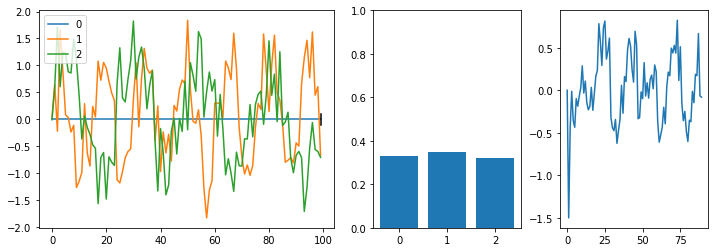

Episode: 5900
Reward : -0.7605990742300124
Average: -1.4337309196312618
----------



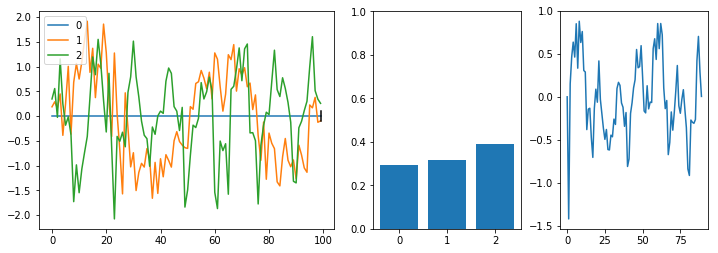

Episode: 6000
Reward : 4.103023636515101
Average: -1.0085900340344645
----------



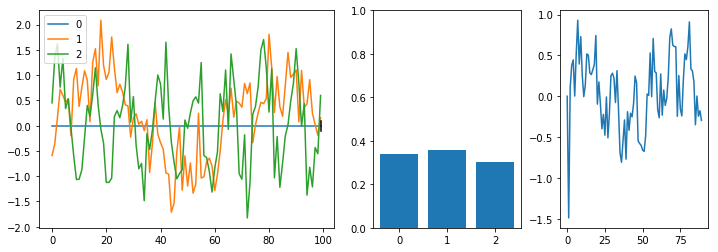

Episode: 6100
Reward : -0.15647209933423856
Average: -2.0021727821188535
----------



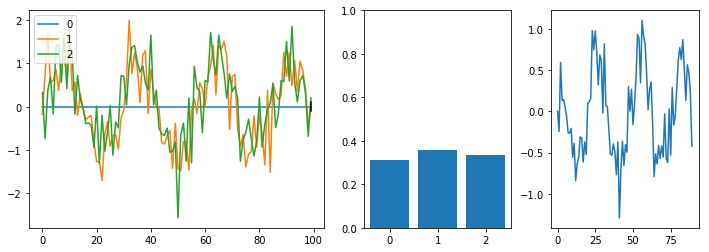

Episode: 6200
Reward : -2.3773418752532525
Average: -0.6231092777315885
----------



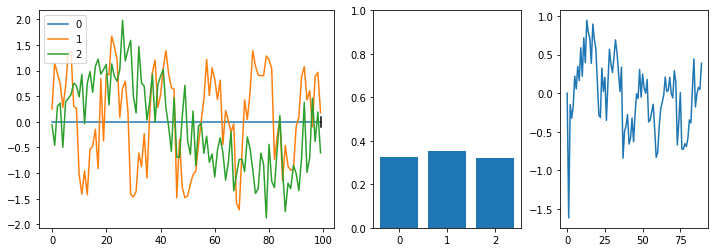

Episode: 6300
Reward : 3.2329642887796766
Average: -1.4746332631358685
----------



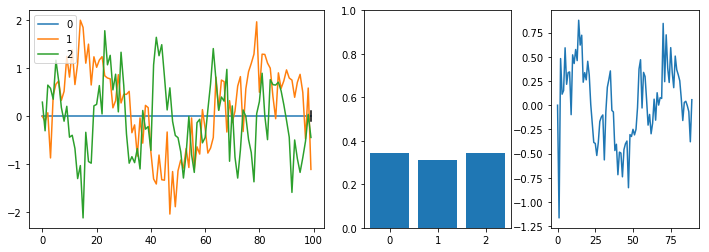

Episode: 6400
Reward : 5.833925129861024
Average: -1.668580116268563
----------



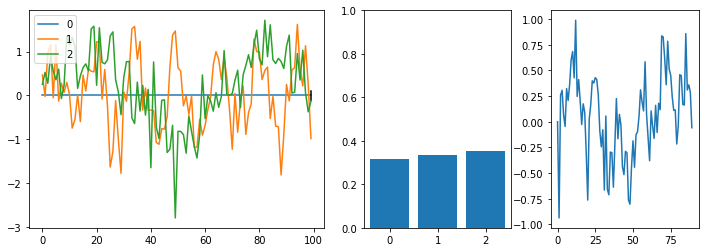

Episode: 6500
Reward : -3.6729578354568675
Average: -1.4475925277203479
----------



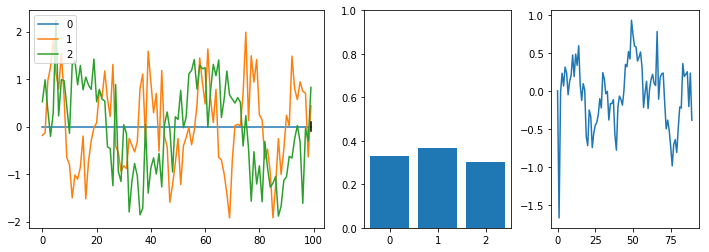

Episode: 6600
Reward : -5.004190117084843
Average: -1.26881481635361
----------



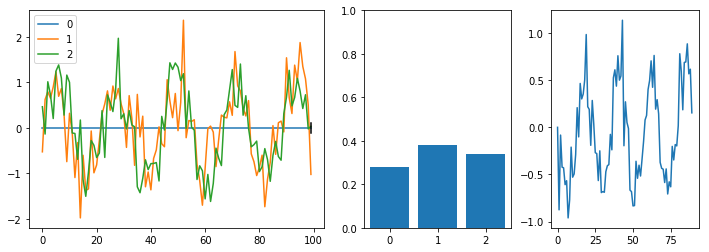

Episode: 6700
Reward : -2.876977644947207
Average: -1.2724004527294386
----------



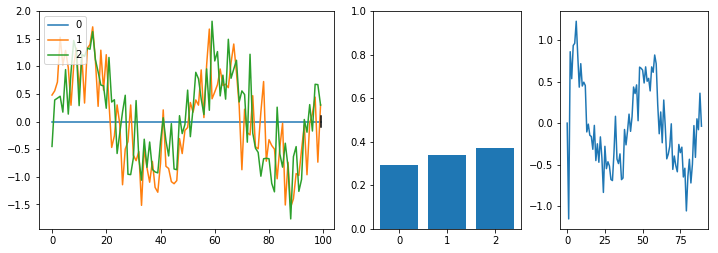

Episode: 6800
Reward : 8.107463420031738
Average: -1.5124911591846781
----------



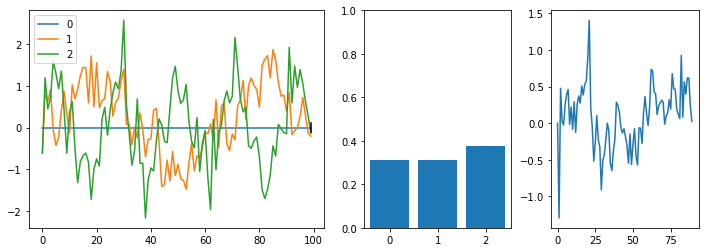

Episode: 6900
Reward : 0.1387904627517651
Average: -1.803161961260384
----------



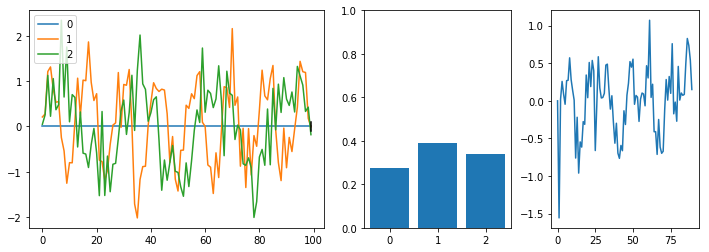

Episode: 7000
Reward : -1.1184341749454507
Average: -1.2369242873364759
----------



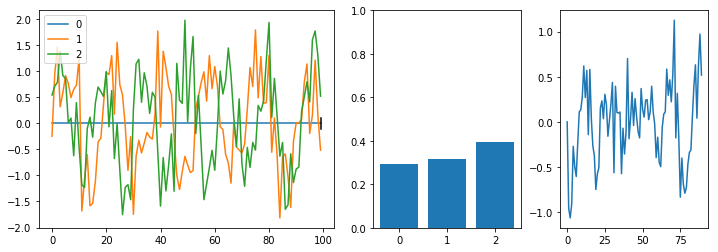

Episode: 7100
Reward : -2.6269757009759465
Average: -1.9039557326733763
----------



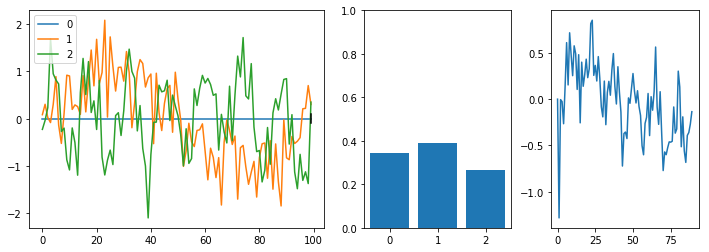

Episode: 7200
Reward : -6.701253988397802
Average: -1.642830421339805
----------



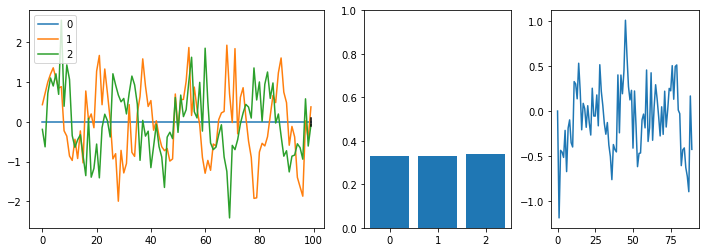

In [ ]:
env = Environment(noise=0.5, friction=1.)
NUM_OBS = env.n_obs
NUM_ACTS = env.n_actions
print_log = False

agent = Agent(n_actions=NUM_ACTS, n_obs=NUM_OBS)
rh = agent.run(env, 10000, verbose=False)

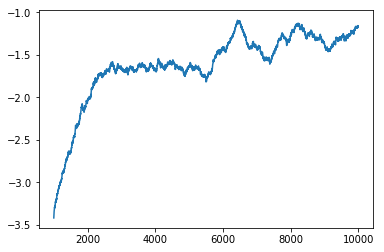

In [325]:
rews = pd.Series(rh).rolling(1000).mean()
plt.plot(rews)

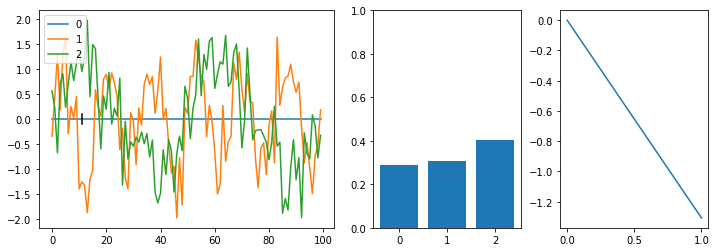

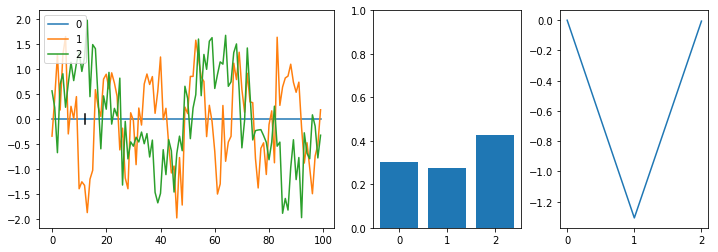

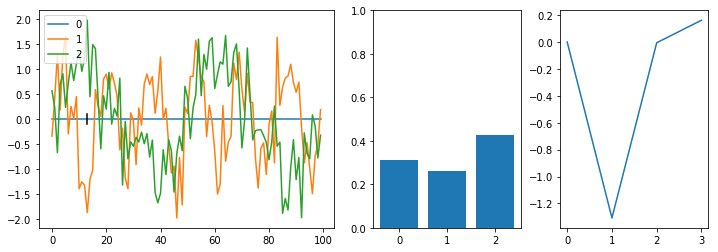

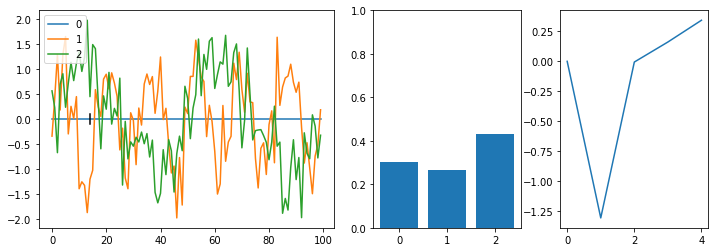

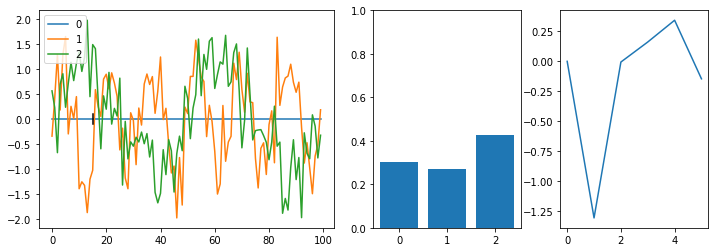

...

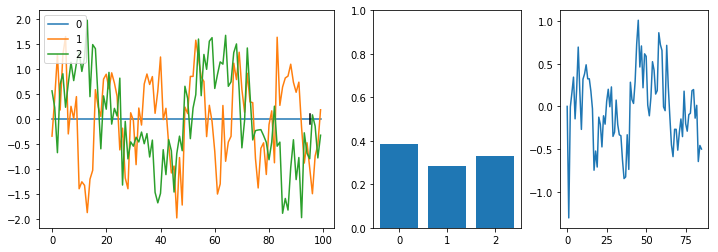

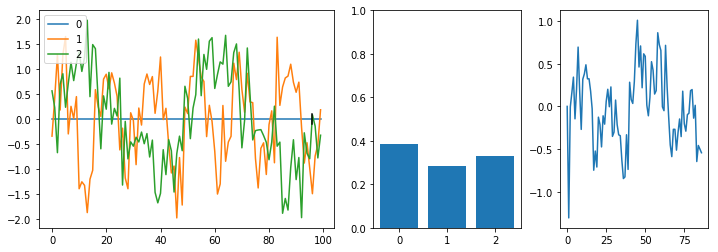

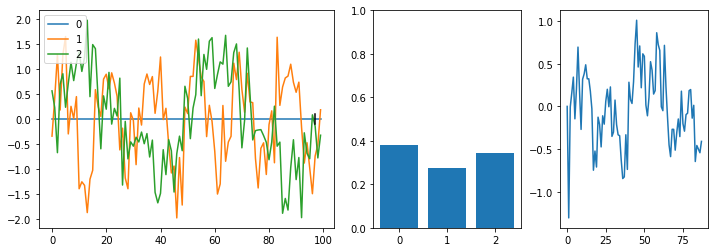

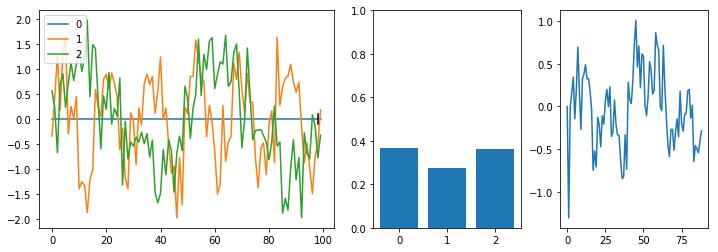

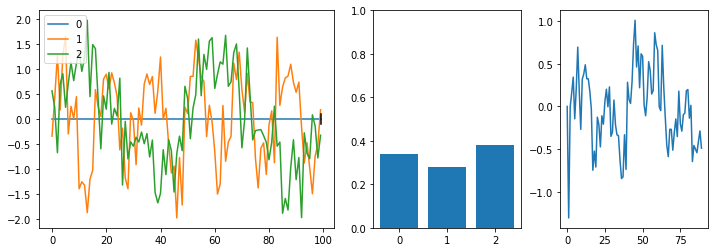

Episode: 0
Reward : -2.7791658405389024
Average: -2.7791658405389024
----------



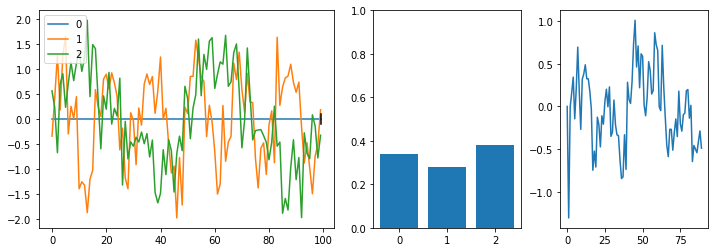

In [326]:
rh = agent.run(env, 1, test_run=True)